# How complexity arises from the simplest models - George Datseris

---

> *(people think that) Natural systems, left to their own devices, would settle down to a state of perfect harmony. A "fixed", balanced state. It is **random** external forces that ruin this balance. [1]* 

---

---


This presentation is an interactive Jupyter notebook. You can download it here: 
https://github.com/JuliaDynamics/JuliaDynamicsDocumentation.jl → tutorials → complex_from_simple

---

---

---


[1] : 17 Equations that changed the world, Ian Stewart

I will present a concept; a concept that I believe every scientist should know. 

Because I want to make you truly understand this, I have to start with a specific, yet simple example.

# Modelling population growth

* I am a biologist that wants to model population growth

* **I don't want to deal with the randomness of real life**

* I want to keep my model as _simple as possible_
  1. I will use only a _single_ population. Let's say RABBITS
  2. I don't want to deal with continuous time... I will just model the population growth every generation.  
  3. I want to have only one parameter, the available food.

## How do I do that?

I got rabbits: 🐇
and carrots: 🥕


Each generation the number of rabbits change, according to my model `growth`. 

Something like: `🐇ₙ₊₁ = growth(🐇ₙ, 🥕)`.

After one step, I take the new population `🐇ₙ₊₁` and plug again into `growth`. This gives me the _next_ population.

What is the simplest `growth` model?

The more rabbits I have, the faster they reproduce. The same goes for the food!

* `growth(🐇, 🥕) = 🐇 * 🥕 `

But wait! The rabbits increase endlessly! I need a "control term"!

* `growth(🐇, 🥕) = 🐇 * 🥕 * (1 - 🐇)`

# `growth(🐇, 🥕) = 🐇 * 🥕 * (1 - 🐇)`

This simple `growth` model I made up is actually called the **Logistic Map**. It was one of the first models used in population growth dynamics! 

- It is **deterministic** :
  1. There are no _random_ factors 
  2. If I know the current "state", I know **exactly** all the future.

In [1]:
using PyPlot
using Interact
matplotlib[:rc]("font", family="Calibri")

function timeseries(growth, 🥕, n = 100)
    ts = zeros(n)
    ts[1] = 🐇 = rand()
    for i in 2:n        
        ts[i] = 🐇 = growth(🐇, 🥕)
    end
    return ts
end

function plot_single_timeseries(growth;🥕 = 2.0, n = 100)
    figure(figsize = (7,4))
    plot(1:n, timeseries(growth, 🥕, n), label = "🥕 = $(🥕)", 
         marker = "o", color = "C1", ms = 3)
    xlabel("n")
    ylabel("🐇")
    ylim(0, 1)
    # legend()
    return nothing
end

function plot_timeseries(growth)
    
    n = 100
    f1 = figure(figsize = (7,4))
    ui = @manipulate for 🥕 = rangeslider(0:0.001:4; value = 0.5, label = "🥕") |> onchange, n = "100" 
        withfig(f1, clear = true) do 
            
            n = parse(Int, n)
            
            ts = timeseries(growth, 🥕, n)
            plot(1:n, ts, color = "C1", alpha = 0.5)
            
            plot(1:n, ts, label = "🥕 = $(🥕)", ls = "None", color = "C1", 
                 marker = "o", ms = 3, mfc = "C2", mec = "C2", clip_on = false)
            
            #l[:set_color]((1.0, 0, 0, 0.2))
            #l[:set_markerfacecolor]("C1")
            xlabel("generation")
            ylabel("population")
            ylim(0, 1)
            xlim(1, n)
        end
    end
    @layout! ui vbox(style(hbox(:🥕, :n), Dict("align-items" => "flex-end")), _.output)
end


HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/19c71ba632ca1580fce8fef9e2088c31c13959e4-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/19c71ba632ca1580fce8fef9e2088c31c13959e4-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

plot_timeseries (generic function with 1 method)

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:🥕=>Widget{:rangeslider,Float64}(OrderedDict{Symbol,Any}(:index=>Observable{Any}("ob_02", 501, Any[##25#28{##65#68,Observable{Float64},Array{Function,1}}(##65#68(Box(0.0:0.001:4.0)), Observable{Float64}("ob_01", 0.5, Any[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-6 =#), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##65#68,Observable{Float64},Array{Function,1}}(#= circular reference @-5 =#)])]), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#]), ##25#28{##65#68,Observable{Float64},Array{Function,1}}(#= circular reference @-2 =#)]), SyncCallback(Scope("scope-f5a02593-d041-432f-80b0-79d82641bc5e", Node{DOM}(DOM(:html, :div), Any[], Dict{Symbol,Any}(:attributes=>Dict("id"=>"sliderQ3RdlyuD"),:style=>Dict{String,Any}("flex-grow"=>"1")), 0), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("fromJS"=>(Observable{Bool}("ob_03", false, Any[]), nothing),"changes"=>(Observable{Int64}("ob_04", 0, Any[##1#2{Widget{:rangeslider,Float64},Observable{Float64}}(Widget{:rangeslider,Float64}(OrderedDict{Symbol,Any}(#= circular reference @-11 =#), Observable{Float64}("ob_01", 0.5, Any[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-13 =#), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##65#68,Observable{Float64},Array{Function,1}}(##65#68(Box(0.0:0.001:4.0)), Observable{Float64}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#])])]), Scope(#= circular reference @-7 =#), ##85#92{String,Bool}("🥕", Box("horizontal"), true)), Observable{Float64}("ob_05", 0.5, Any[#g#15{##16#17{typeof(identity),Widget{:rangeslider,Float64}},Tuple{Observable{Float64}}}(##16#17{typeof(identity),Widget{:rangeslider,Float64}}(identity, Widget{:rangeslider,Float64}(OrderedDict{Symbol,Any}(#= circular reference @-15 =#), Observable{Float64}("ob_01", 0.5, Any[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-17 =#), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##65#68,Observable{Float64},Array{Function,1}}(##65#68(Box(0.0:0.001:4.0)), Observable{Float64}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#])])]), Scope(#= circular reference @-11 =#), ##85#92{String,Bool}("🥕", Box("horizontal"), true))), (Observable{Float64}(#= circular reference @-4 =#),)), #g#15{##16#17{##4#8{typeof(growth),Figure},Observable{Any}},Tuple{Observable{Float64},Observable{String}}}(##16#17{##4#8{typeof(growth),Figure},Observable{Any}}(##4#8{typeof(growth),Figure}(growth, Figure(PyObject <Figure size 700x400 with 1 Axes>)), Observable{Any}("ob_08", Figure(PyObject <Figure size 700x400 with 1 Axes>), Any[])), (Observable{Float64}(#= circular reference @-4 =#), Observable{String}("ob_06", "100", Any[SyncCallback(Scope("knockout-component-b383a26e-02ee-4aac-a3e8-30ff2e158244", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["n"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("class"=>"interact-flex-row-left")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:attributes=>Dict{Any,Any}(:type=>"text",Symbol("data-bind")=>"value: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}"),:placeholder=>"",:className=>"input ",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("class"=>"interact-flex-row-center")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div)
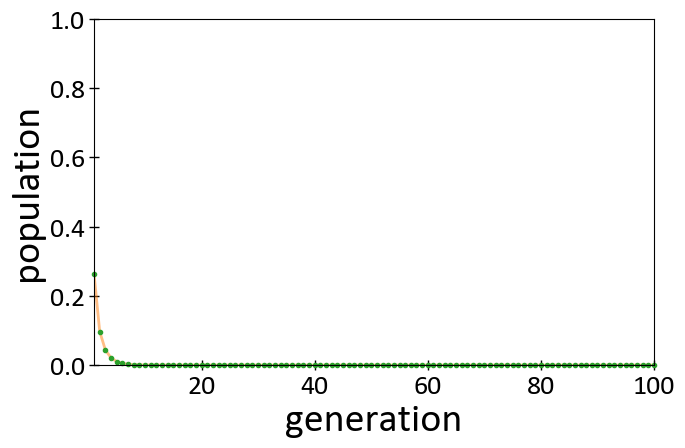
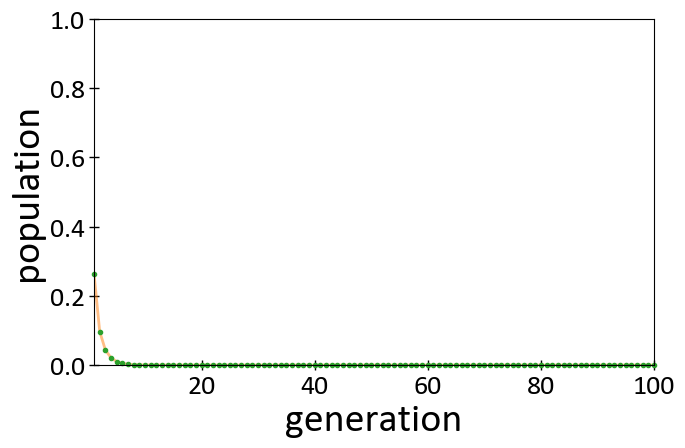

In [2]:
# Define the model in a programming language

growth(🐇, 🥕) = 🐇 * 🥕 * (1.0 - 🐇)

# Given carrot amount, plot the evolution of the system
plot_timeseries(growth)

- 0.5 : Alright, so what we see is that if there are too few carrots, the rabbits die. Kind of expected.
- 1.1 : Given enough carrots, the population goes into this expected fixed state. 
- 2.5 : Okay so it seems like my natural system has gotten into this "fixed state" and will stay there forever like all natural systems would, right?
- 3.2 : Just for fun, I increase the amount of carrots just a bit. I see that the behavior changed! Now the population alternates between two values: one generation has a lot of carrots and reproduces a lot, but then the next generation doesn't have as much and reproduces less.
- 3.5 : Adding even more carrots, the behavior changes yet again! Now the population alternates between four values! You could say that this reflects the four seasons, but I don't know about that...
- 4.0 : Alright, something is wrong here: The population doesn't go into a fixed value... It must be because we didn't let time run long enough, right? (1000). Naah something is wrong here. Such a trivial model should go into a fixed state, right? (10,000), well, to spoil it for you, it ain't gonna happen.

## What's going on here?

* I want an "overview" of `growth`, based on how many  🥕 I provide.

* I will plot on the `x`-axis the amount of 🥕. 

* On the `y`-axis I will plot this (supposedly) "fixed", "balanced" state that results from `growth`.

In [3]:
function orbitdiagram(growth, r1, r2, n = 500, a = zeros(1000, n); T = 1000)
    rs = range(r1, stop = r2, length = 1000)
    for (j, r) in enumerate(rs)
        x = 0.5
        for _ in 1:T; x = growth(x, r); end
        for i in 1:n
            x = growth(x, r)
            @inbounds a[j, i] = x
        end
    end
    rs, a
end

function plot_orbitdiagram(growth)
    r1 = 0.0
    r2 = 3.0
    n = 1000
    f2 = figure(figsize = (12,6))
    @manipulate for 🥕🥕 = rangeslider(0:0.001:4; value = [0.0, 3.0], label = "🥕") |> onchange
        withfig(f2, clear = true) do 
            r1, r2 = 🥕🥕
            rs, a = orbitdiagram(growth, r1, r2)
            plot(rs, a, ls = "None", marker = ".", ms = 0.2, color = "C1", 
                 alpha = 0.4, clip_on = false);
            xlabel("carrots")
            ylabel("final state")
            ylim(0, 1)
            xlim(r1, r2)
        end
    end
end

plot_orbitdiagram (generic function with 1 method)

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:🥕🥕=>Widget{:rangeslider,Array{Float64,1}}(OrderedDict{Symbol,Any}(:index=>Observable{Any}("ob_11", [1, 3001], Any[##25#28{##65#68,Observable{Array{Float64,1}},Array{Function,1}}(##65#68(Box(0.0:0.001:4.0)), Observable{Array{Float64,1}}("ob_10", [0.0, 3.0], Any[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-6 =#), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##65#68,Observable{Array{Float64,1}},Array{Function,1}}(#= circular reference @-5 =#)])]), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#]), ##25#28{##65#68,Observable{Array{Float64,1}},Array{Function,1}}(#= circular reference @-2 =#)]), SyncCallback(Scope("scope-82ac9872-9c69-4a51-89de-95efd6d17e1a", Node{DOM}(DOM(:html, :div), Any[], Dict{Symbol,Any}(:attributes=>Dict("id"=>"slider8Kz924ca"),:style=>Dict{String,Any}("flex-grow"=>"1")), 0), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("fromJS"=>(Observable{Bool}("ob_12", false, Any[]), nothing),"changes"=>(Observable{Int64}("ob_13", 0, Any[##1#2{Widget{:rangeslider,Array{Float64,1}},Observable{Array{Float64,1}}}(Widget{:rangeslider,Array{Float64,1}}(OrderedDict{Symbol,Any}(#= circular reference @-11 =#), Observable{Array{Float64,1}}("ob_10", [0.0, 3.0], Any[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-13 =#), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##65#68,Observable{Array{Float64,1}},Array{Function,1}}(##65#68(Box(0.0:0.001:4.0)), Observable{Array{Float64,1}}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#])])]), Scope(#= circular reference @-7 =#), ##85#92{String,Bool}("🥕", Box("horizontal"), true)), Observable{Array{Float64,1}}("ob_14", [0.0, 3.0], Any[#g#15{##16#17{typeof(identity),Widget{:rangeslider,Array{Float64,1}}},Tuple{Observable{Array{Float64,1}}}}(##16#17{typeof(identity),Widget{:rangeslider,Array{Float64,1}}}(identity, Widget{:rangeslider,Array{Float64,1}}(OrderedDict{Symbol,Any}(#= circular reference @-15 =#), Observable{Array{Float64,1}}("ob_10", [0.0, 3.0], Any[##24#27{##63#66,Observable{Any},Array{Function,1}}(##63#66(Box(0.0:0.001:4.0)), Observable{Any}(#= circular reference @-17 =#), Function[##24#27{##63#66,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##65#68,Observable{Array{Float64,1}},Array{Function,1}}(##65#68(Box(0.0:0.001:4.0)), Observable{Array{Float64,1}}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#])])]), Scope(#= circular reference @-11 =#), ##85#92{String,Bool}("🥕", Box("horizontal"), true))), (Observable{Array{Float64,1}}(#= circular reference @-4 =#),)), #g#15{##16#17{##13#16{typeof(growth),Figure},Observable{Any}},Tuple{Observable{Array{Float64,1}}}}(##16#17{##13#16{typeof(growth),Figure},Observable{Any}}(##13#16{typeof(growth),Figure}(growth, Box(0.0), Box(3.0), Figure(PyObject <Figure size 1200x600 with 1 Axes>)), Observable{Any}("ob_15", Figure(PyObject <Figure size 1200x600 with 1 Axes>), Any[])), (Observable{Array{Float64,1}}(#= circular reference @-4 =#),))]))]), nothing),"index"=>(Observable{Any}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, ["C:\\Users\\datseris\\.julia\\dev\\InteractBase\\src\\..\\assets\\nouislider.min.js", "C:\\Users\\datseris\\.julia\\dev\\InteractBase\\src\\..\\assets\\nouislider.min.css", "C:\\Users\\datseris\\.julia\\dev\\InteractBase\\src\\..\\assets\\all.js", "C:\\Users\\datseris\\.julia\\dev\\InteractBase\\src\\..\\assets\\style.css", "C:\\Users\\datseris\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (no
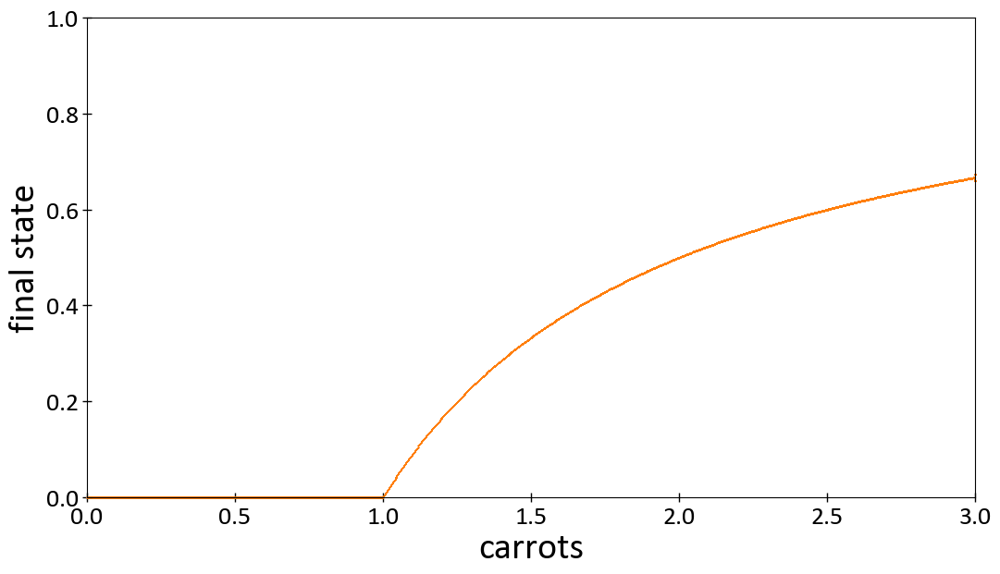
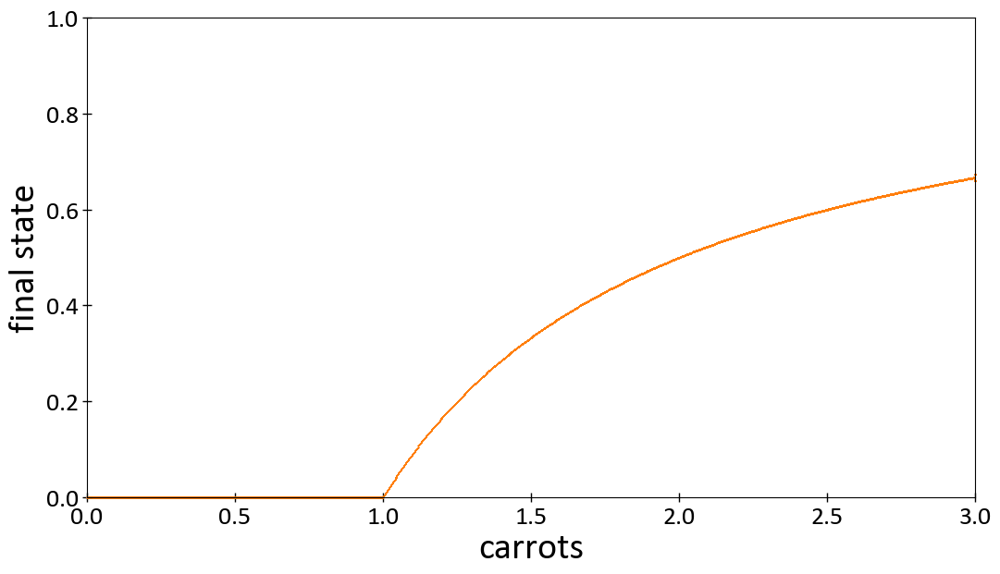

In [4]:
plot_orbitdiagram(growth) 

## But is this real though?

### *Meeeeeeh this is suuuuuuper specific, toooooootally not happening in real life*

This is an **universal** behavior. Here are some examples that display it:

* Insect popullations
* Weather (models)
* Fluid flows 
* Electronic circuits
* Neuron firing patterns
* Cardiac tissue

*and the list goes on...*



D.W. Crevier, M. Meister, **Synchronous period-doubling in flicker vision of salamander and man**, Journal of Neurophysiology, 79 (1998) 1869-1878.

R. Falahian *et. al*, **Artificial neural network-based modeling of brain response to flicker light**, Nonlinear Dynamics, 81 (2015) 1951-1967.


Huaguang Gu *et. al*, **Biological experimental demonstration of bifurcations from bursting to spiking predicted by theoretical models**, Nonlinear Dynamics 78 (1), 391-407 (2014)

Bing Jia, Huaguang Gu, Li Li, Xiaoyan Zhao, **Dynamics of period-doubling bifurcation to chaos in the spontaneous neural firing patterns**, Cognitive Neurodynamics, 2012, 6(1): 89–106.


Huaguang Gu, **Biological Experimental Observations of an Unnoticed Chaos as Simulated by the Hindmarsh-Rose Model**,  https://doi.org/10.1371/journal.pone.0081759


Dante R. Chialvo *et. al*, **Low dimensional chaos in cardiac tissue**, Nature 343, pages 653–657 (15 February 1990)

Thomas Quail, Alvin Shrier, and Leon Glass, **Predicting the onset of period-doubling bifurcations in
noisy cardiac systems**, https://doi.org/10.1073/pnas.1424320112 

See also www2.math.uu.se/~david/MCS/lecture2.pdf on why it is hard to observe this in real population growth

## How does it look in real life?

In [5]:
using AssetRegistry
cardiac_image = AssetRegistry.register("cardiac_tissue_doubling.png")

"/assetserver/e4c994d2dde3fba12e94e6de8296b3a6cc517c79-cardiac_tissue_doubling.png"

In [6]:
node(:img, src = cardiac_image)

(img { src="/assetserver/e4c994d2dde3fba12e94e6de8296b3a6cc517c79-cardiac_tissue_doubling.png" })

# Simple rules → Complex behavior


* My point is **not** that this _specific_ system leads to complex behavior!

* This is a **common pattern** in both models and in nature: Simple rules do not mean simple behavior!

* Most of the time simple rules lead to very complex behavior!

# Deterministic Chaos

(when simple systems go nuts)

- **Deterministic** :
  1. There are no _random_ factors 
  2. **Exact** knowledge of the current "state" **gives exact** knowledge of all future.

- **Chaos** :
  1. Fancy word for saying "maaan, that behavior looks totally random to me"
  2. **Approximate** knowledge of the current "state" **does NOT give approximate** knowledge of the future.

* Some students are working "explicitly" on deterministic chaos
* If you think this was a cool topic, talk with your colleagues! Long bus ride incoming...

# Complexity = Reality

Thank you!